In [1]:
import os, sys, time
import cv2
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [2]:
test_dir = "data/deepfake-detection-challenge/test_videos/"

In [3]:
# Get the file name of all the videos.
test_videos = sorted([x for x in os.listdir(test_dir) if x[-4:] == ".mp4"]) 
# Get the device, if gpu and cuda is available for faster processing. 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [4]:
import sys
cwd = os.getcwd()
sys.path.insert(0,cwd + "/imports/blazeface")
sys.path.insert(0,cwd +  "/imports/inference")
print(sys.version)

3.8.10 (default, Jun  2 2021, 10:49:15) 
[GCC 9.4.0]


In [5]:
from blazeface import BlazeFace

In [6]:
# Load blazeface training weights
facedet = BlazeFace().to(device)
facedet.load_weights(cwd + "/imports/blazeface/blazeface.pth")
facedet.load_anchors(cwd + "/imports/blazeface/anchors.npy")
_ = facedet.train(False)

In [7]:
from helpers.read_video_1 import VideoReader
from helpers.face_extract_1 import FaceExtractor

frames_per_video = 150

video_reader = VideoReader()
video_read_fn = lambda x: video_reader.read_frames(x, num_frames=frames_per_video)
face_extractor = FaceExtractor(video_read_fn, facedet)

In [8]:
input_size =224 

In [9]:
# All pre-trained models expect input images normalized in the same way, i.e.
# mini-batches of 3-channel RGB videos of shape (3 x T x H x W), 
# where H and W are expected to be 112, and T is a number of video frames in a clip. 
# The images have to be loaded in to a range of [0, 1] and then normalized using mean = 
# [0.43216, 0.394666, 0.37645] and std = [0.22803, 0.22145, 0.216989].

In [10]:
# Here we normalize the image
from torchvision.transforms import Normalize

mean = [0.43216, 0.394666, 0.37645]
std = [0.22803, 0.22145, 0.216989]
normalize_transform = Normalize(mean,std)

In [11]:
# Here we use opencv to resize the image isotropically so that it does not go out of dimension.
def isotropically_resize_image(img, size, resample=cv2.INTER_AREA):
    h, w = img.shape[:2]
    if w > h:
        h = h * size // w
        w = size
    else:
        w = w * size // h
        h = size

    resized = cv2.resize(img, (w, h), interpolation=resample)
    return resized

# here we use opencv to make the frame square.
def make_square_image(img):
    h, w = img.shape[:2]
    size = max(h, w)
    t = 0
    b = size - h
    l = 0
    r = size - w
    return cv2.copyMakeBorder(img, t, b, l, r, cv2.BORDER_CONSTANT, value=0)

In [12]:
import torch.nn as nn
import torchvision.models as models

class MyResNeXt(models.resnet.ResNet):
    def __init__(self, training=True):
        super(MyResNeXt, self).__init__(block=models.resnet.Bottleneck,
                                        layers=[3, 4, 6, 3], 
                                        groups=32, 
                                        width_per_group=4)
        self.fc = nn.Linear(2048, 1)

In [13]:
checkpoint = torch.load(cwd + "/imports/inference/resnext.pth", map_location=device)

model = MyResNeXt().to(device)
model.load_state_dict(checkpoint)
_ = model.eval()

del checkpoint

In [14]:
input_size = 224

In [15]:
def predict_on_video(video_path, batch_size):
    try:
        # Find the faces for N frames in the video.
        faces = face_extractor.process_video(video_path)
        face_extractor.keep_only_best_face(faces)
        
        if len(faces) > 0:
            x = np.zeros((batch_size, input_size, input_size, 3), dtype=np.uint8)
            n = 0
            for frame_data in faces:
                for face in frame_data["faces"]:
                    # print("Before resize")
                    # plt.imshow(face, interpolation='nearest')
                    # plt.show()
                    print("After Resize")
                    resized_face = isotropically_resize_image(face, input_size)
                    resized_face = make_square_image(resized_face)
                    # print(resized_face)
                    plt.imshow(resized_face, interpolation='nearest')
                    # file_name_save='Feature1_datatest2/'+video_path[-12:-4]+str(n)+'.png'
                    # plt.savefig(file_name_save)
                    plt.show()

                    if n < batch_size:
                        x[n] = resized_face
                        n += 1
                    else:
                        print("WARNING: have %d faces but batch size is %d" % (n, batch_size))

            if n > 0:
                x = torch.tensor(x, device=device).float()
                x = x.permute((0, 3, 1, 2))

                for i in range(len(x)):
                    x[i] = normalize_transform(x[i] / 255.)
                with torch.no_grad():
                    y_pred = model(x)
                    y_pred = torch.sigmoid(y_pred.squeeze())
                    return y_pred[:n].mean().item()

    except Exception as e:
        print("Prediction error on video %s: %s" % (video_path, str(e)))

    return 0.5

In [16]:
#used to run all the files
fullvideospath = []
for i in range(0,len(test_videos)):
    temp = cwd + "/" + test_dir  +  test_videos[i]
    fullvideospath.append(temp)
    #print(temp)

In [17]:
frames_per_video

150

After Resize


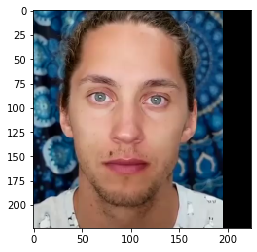

After Resize


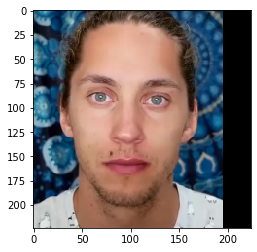

After Resize


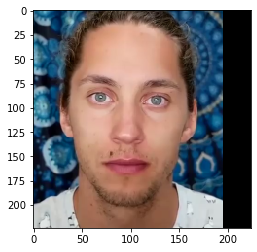

After Resize


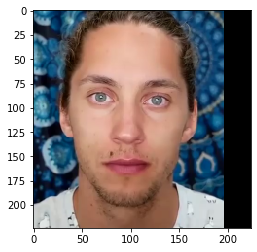

After Resize


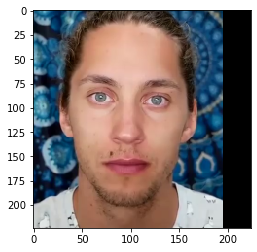

After Resize


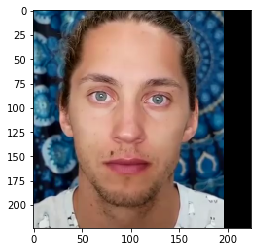

After Resize


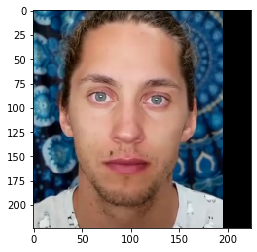

After Resize


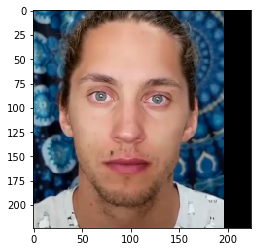

After Resize


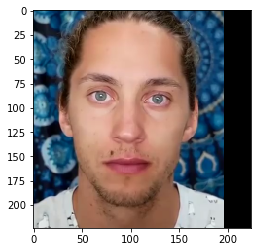

After Resize


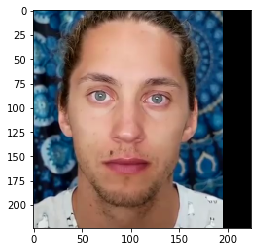

After Resize


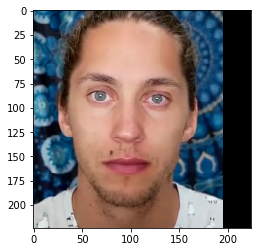

After Resize


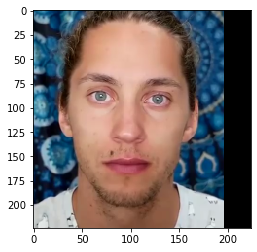

After Resize


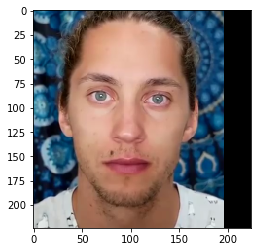

After Resize


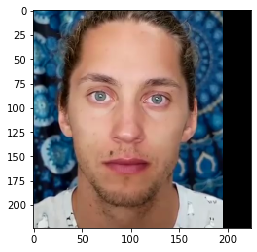

After Resize


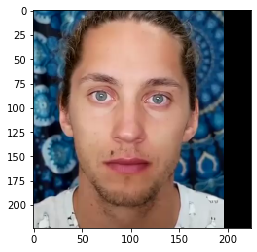

After Resize


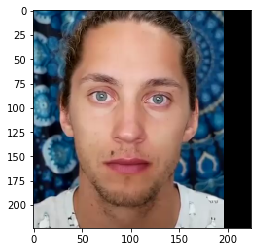

After Resize


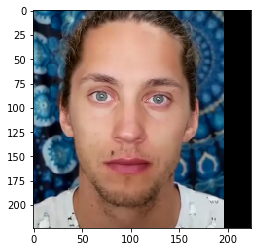

After Resize


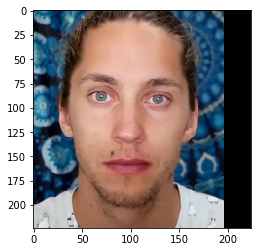

After Resize


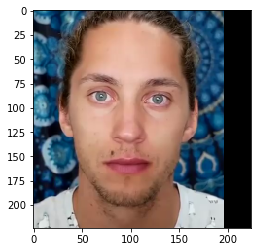

After Resize


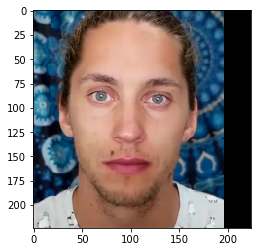

After Resize


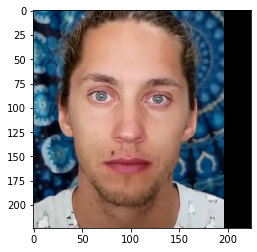

After Resize


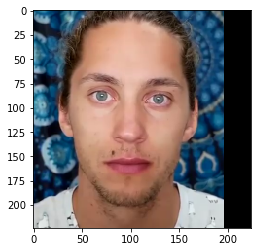

After Resize


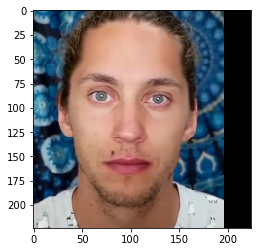

After Resize


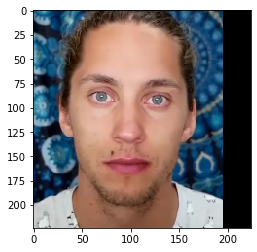

After Resize


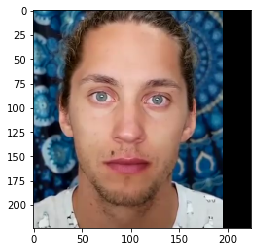

After Resize


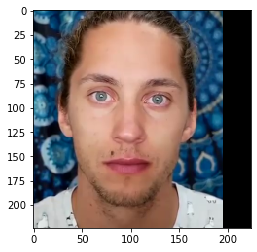

After Resize


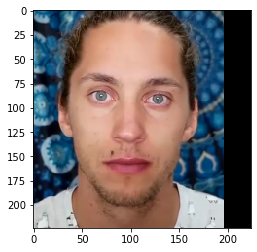

After Resize


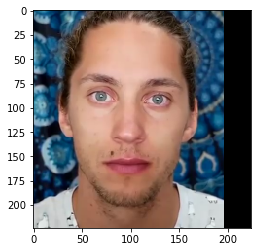

After Resize


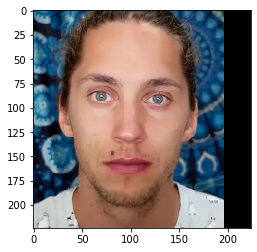

After Resize


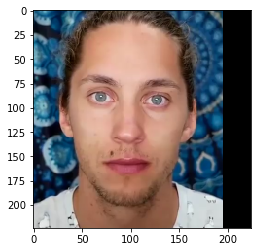

After Resize


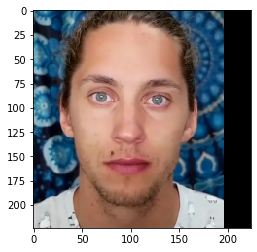

After Resize


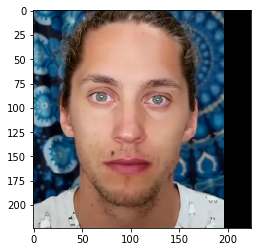

After Resize


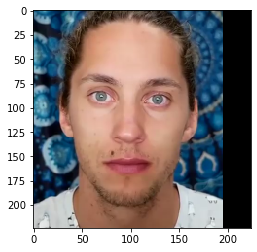

After Resize


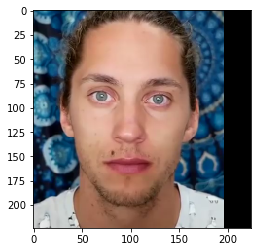

After Resize


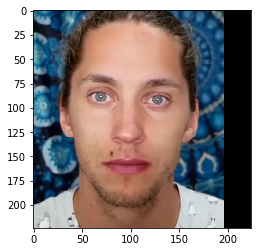

After Resize


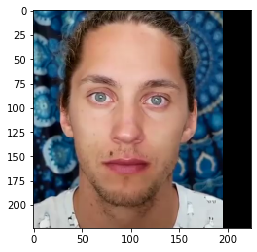

After Resize


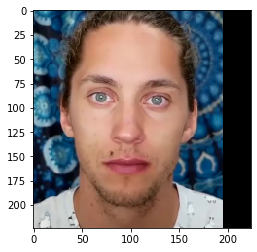

After Resize


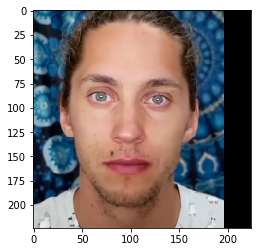

After Resize


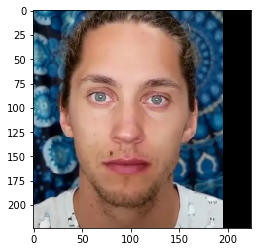

After Resize


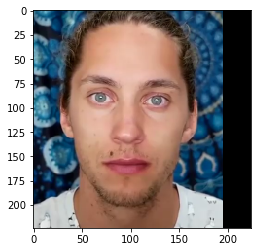

After Resize


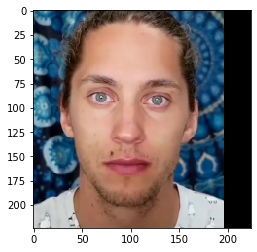

After Resize


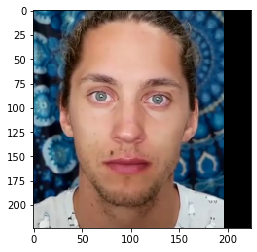

After Resize


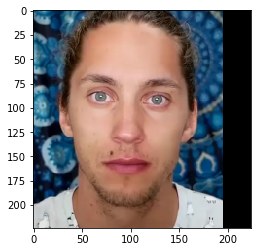

After Resize


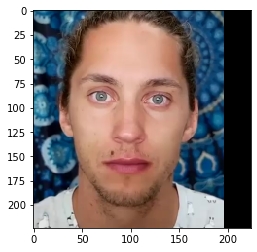

After Resize


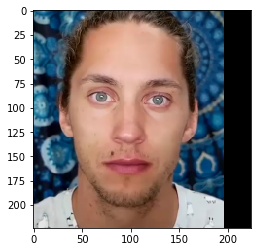

After Resize


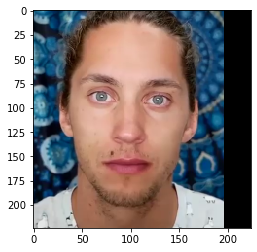

After Resize


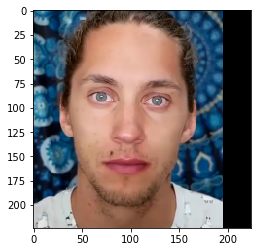

After Resize


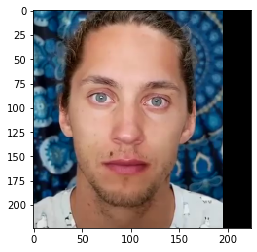

After Resize


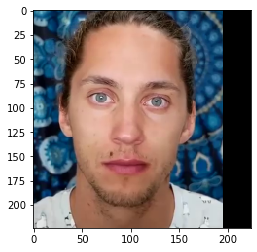

After Resize


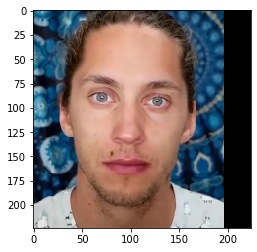

After Resize


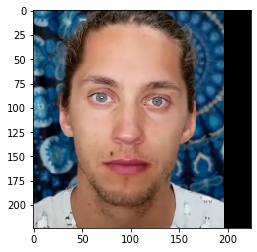

After Resize


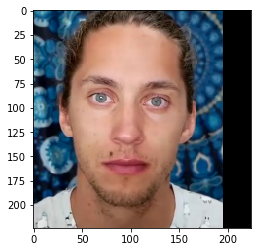

After Resize


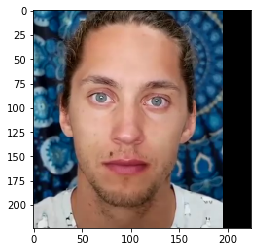

After Resize


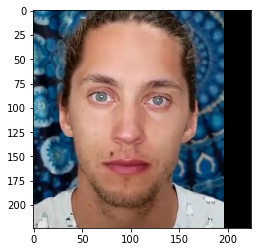

After Resize


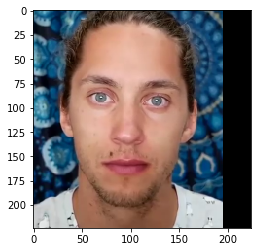

After Resize


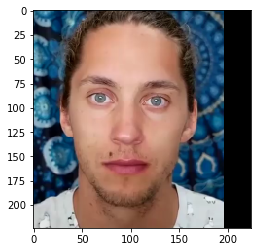

After Resize


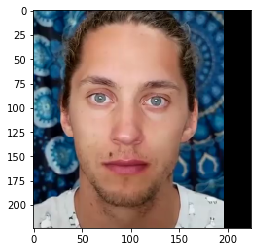

After Resize


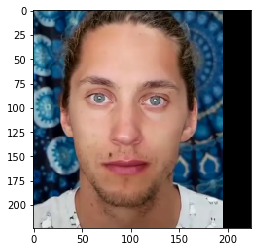

After Resize


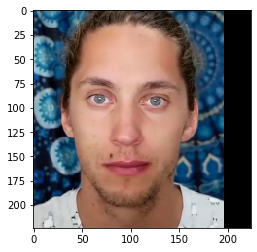

After Resize


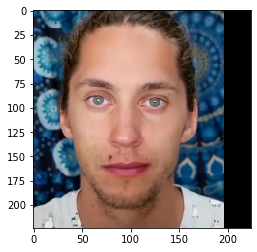

After Resize


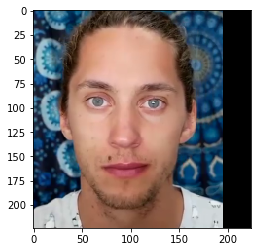

After Resize


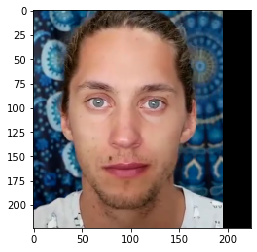

After Resize


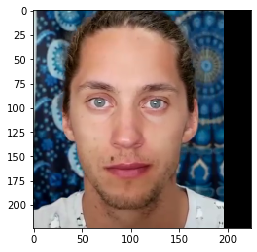

After Resize


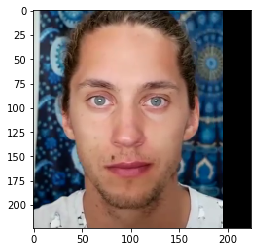

After Resize


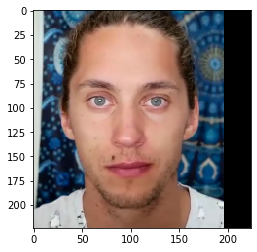

After Resize


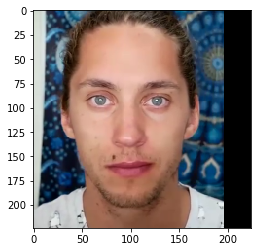

After Resize


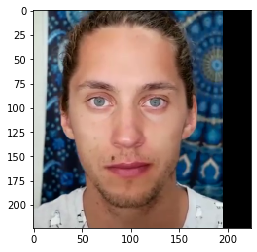

After Resize


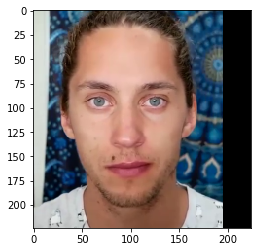

After Resize


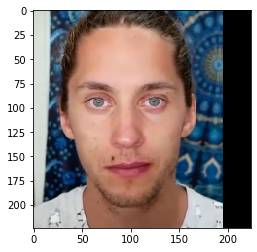

After Resize


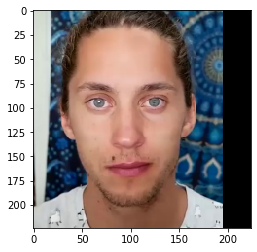

After Resize


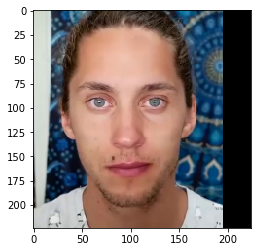

After Resize


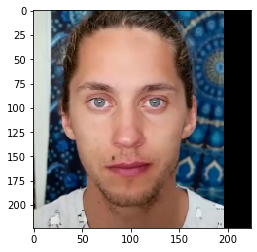

After Resize


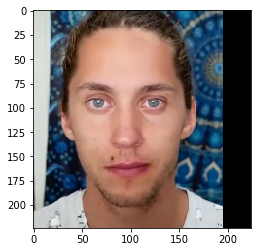

After Resize


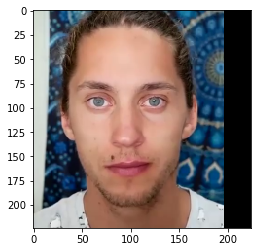

After Resize


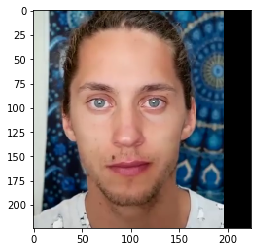

After Resize


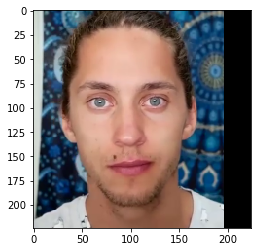

After Resize


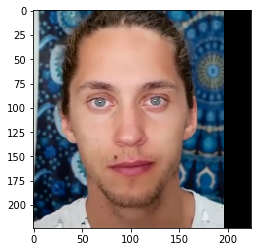

After Resize


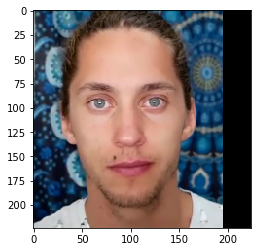

After Resize


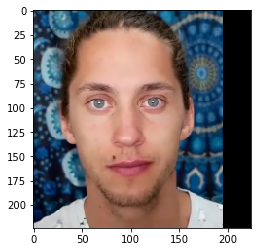

After Resize


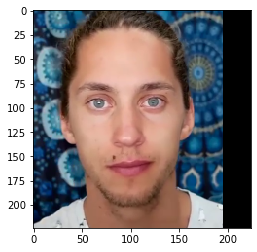

After Resize


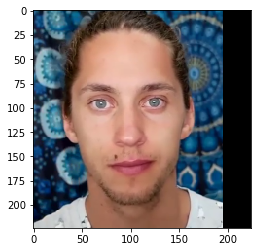

After Resize


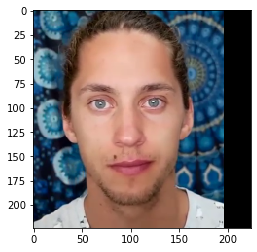

After Resize


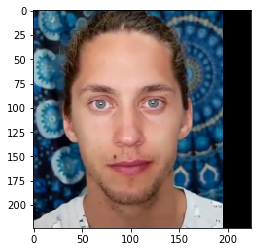

After Resize


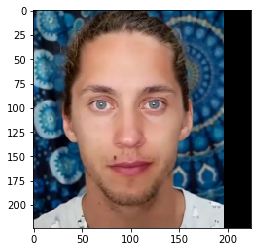

After Resize


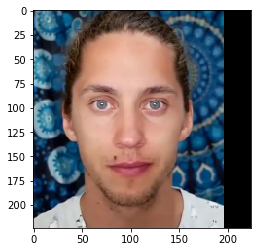

After Resize


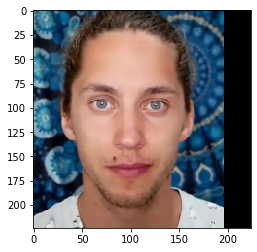

After Resize


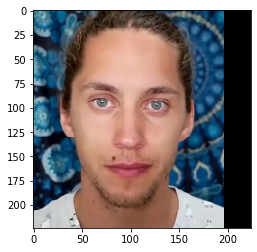

After Resize


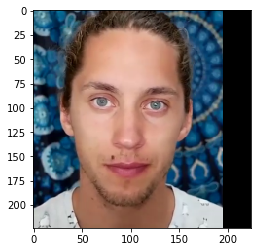

After Resize


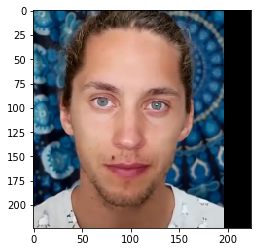

After Resize


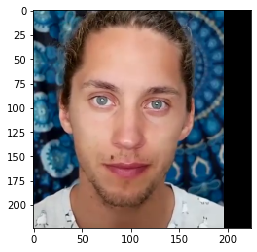

After Resize


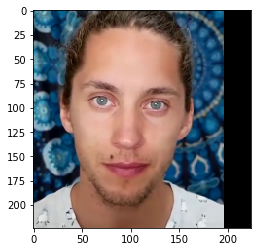

After Resize


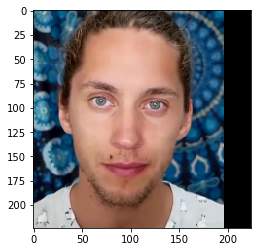

After Resize


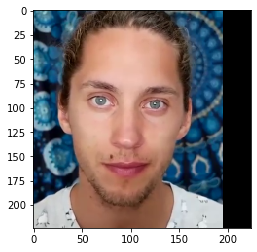

After Resize


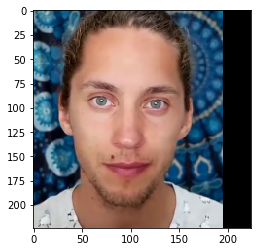

After Resize


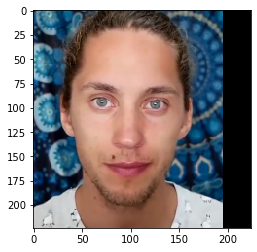

After Resize


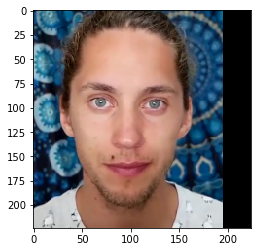

After Resize


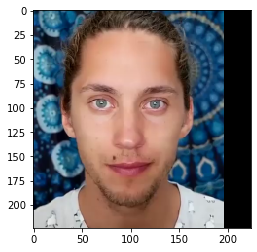

After Resize


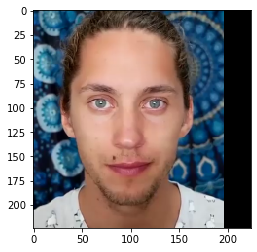

After Resize


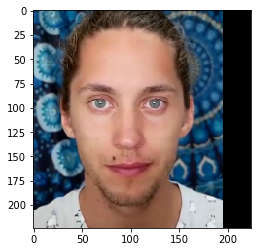

After Resize


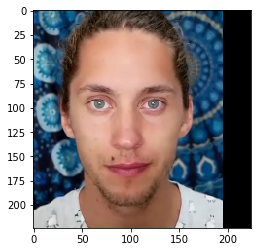

After Resize


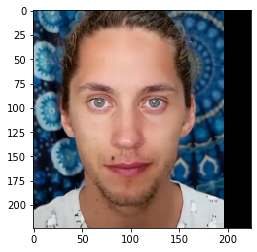

After Resize


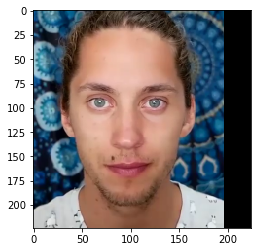

After Resize


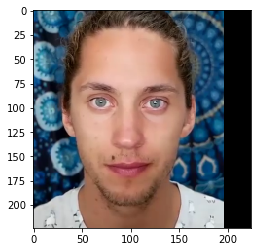

After Resize


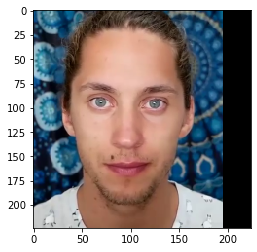

After Resize


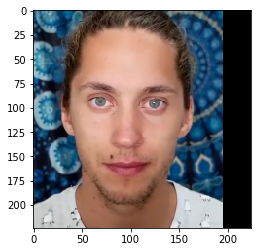

After Resize


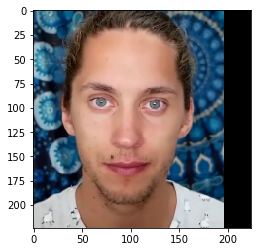

After Resize


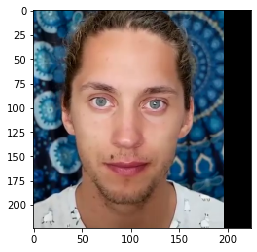

After Resize


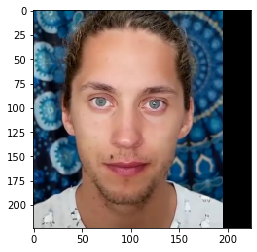

After Resize


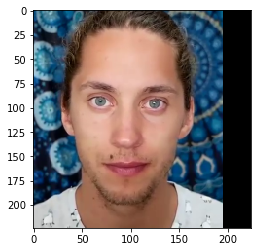

After Resize


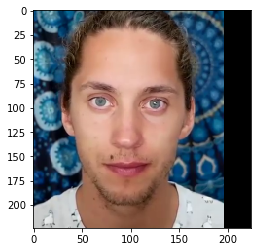

After Resize


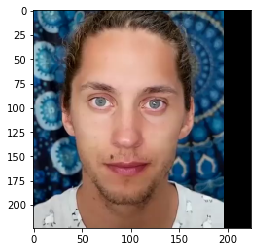

After Resize


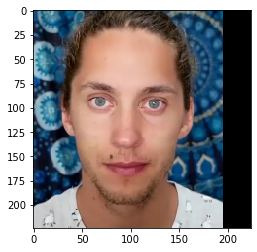

After Resize


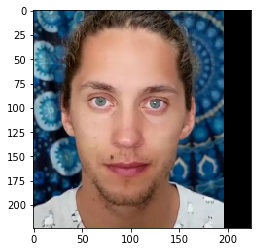

After Resize


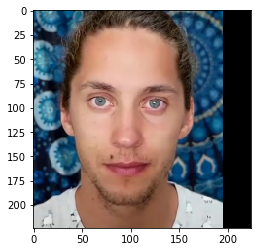

After Resize


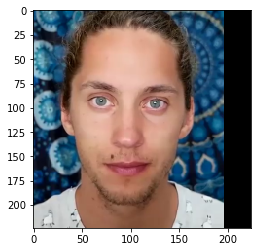

After Resize


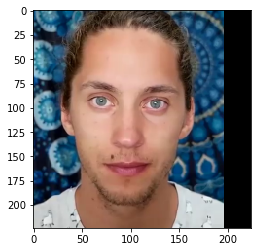

After Resize


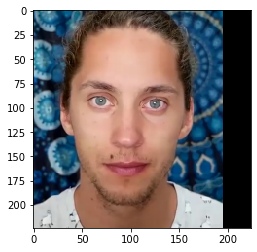

After Resize


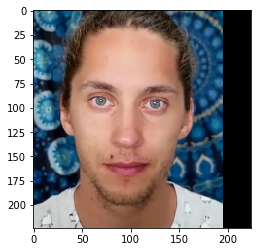

After Resize


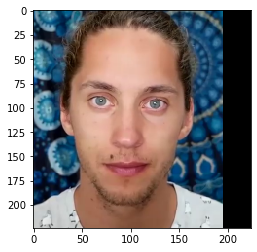

After Resize


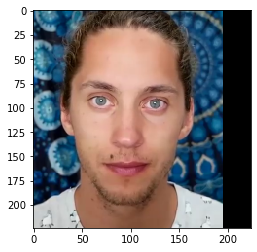

After Resize


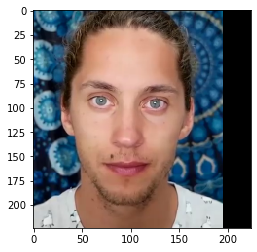

After Resize


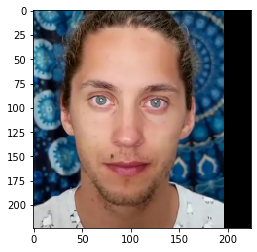

After Resize


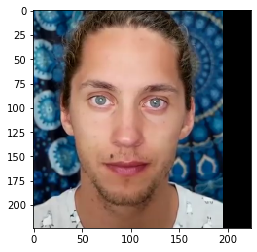

After Resize


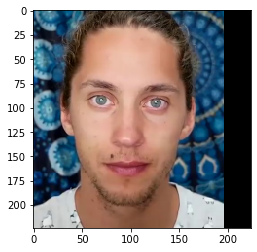

After Resize


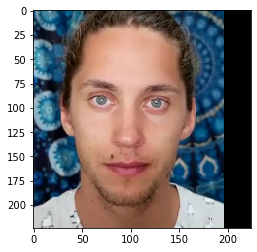

After Resize


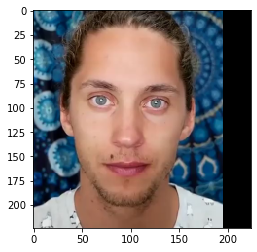

After Resize


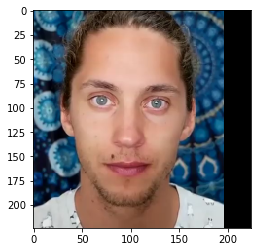

After Resize


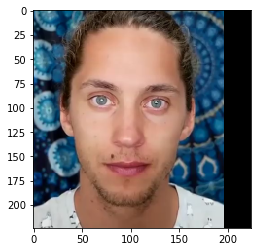

After Resize


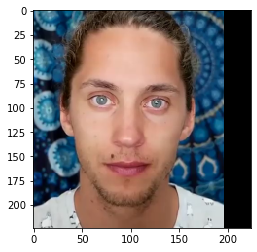

After Resize


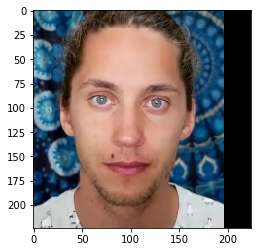

After Resize


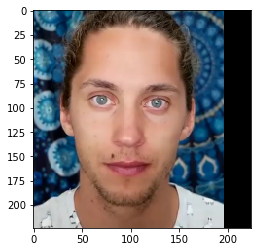

After Resize


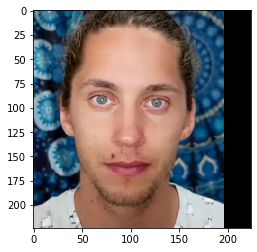

After Resize


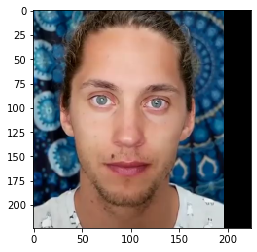

After Resize


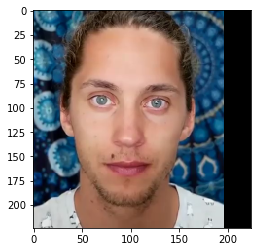

After Resize


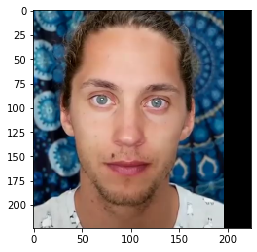

After Resize


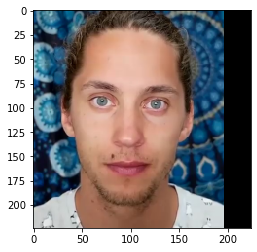

After Resize


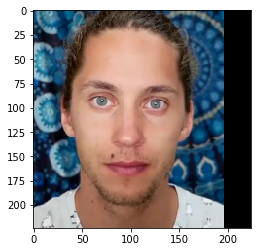

After Resize


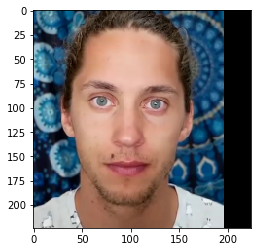

After Resize


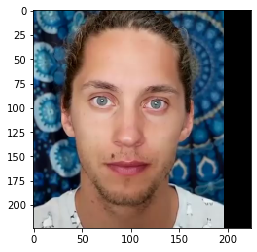

After Resize


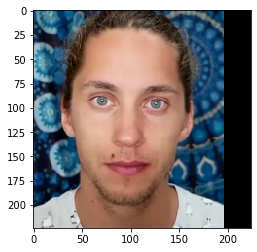

After Resize


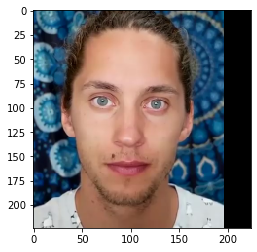

After Resize


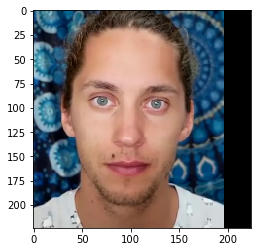

After Resize


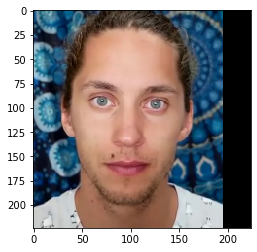

After Resize


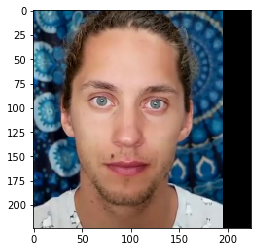

After Resize


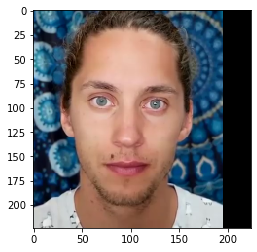

After Resize


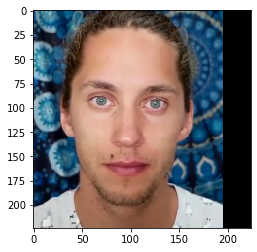

After Resize


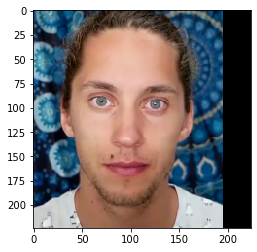

After Resize


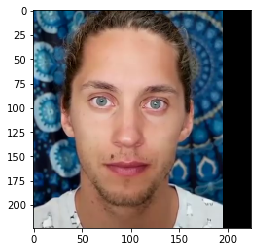

After Resize


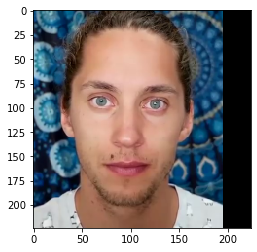

After Resize


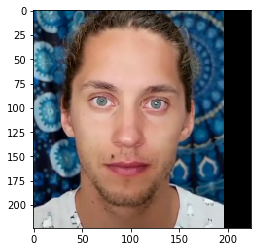

0.003642347175627947


In [18]:
# temp_path_1=cwd + "/" + test_dir  +  "usethis.mp4"
result_score_1=predict_on_video(temp_path_1, frames_per_video)
print(result_score_1)